<center>
<img src="https://i.ibb.co/Ycs11Fg/meme.jpg">
</center>

# Андан на экономе: домашнее задание 3
## Задача классификации

**ФИО: Парамонов Всеволод Антонович**


## Общая информация


__Дата выдачи:__ 14.04.2023

__Мягкий дедлайн:__ 23:59MSK 07.05.2023

__Жесткий дедлайн:__ 23:59MSK 14.05.2023

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 100 баллов. За каждый день просрочки после мягкого дедлайна снимается 10 баллов. После жёсткого дедлайна работы не принимаются. Даже при опозданиии на одну секунду. Сдавайте работы заранее.

Мягкий дедлайн можно отодвинуть без потери баллов на 1,2 или 3 дня. Суммарно для откладывания в запасе есть три дня. Можно отодвинуть один дедлайн на три дня, а можно три дедлайна подвинуть на один день. Распоряжаться этими днями студент может как угодно. Жёсткий дедлайн, при этом, не меняется. Если такое произошло, нужно сообщить о сдвиге при сдаче работы.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Любой из студентов может быть вызван на защиту любого домашнего задания. В таком случае итоговая оценка студента определяется в результате защиты.

> За отсутствие названий графиков и подписей к осям могут снижаться баллы. Все картинки должны быть самодостаточны и визуально удобны для восприятия, так чтобы не нужно было смотреть ваш код или знать задание, чтобы понять что на них изображено. 

> Выводы должны быть релевантными. Не забывайте их писать. Если в вопросе требуется ответ словами, а его нет, вы будете терять довольно много баллов.

> Фиксируйте все seed'ы, random_state'ы и тд - ваш код должен быть воспроизводим с теми же результатами.

## Формат сдачи

Сам ноутбук называйте в формате hw-03-USERNAME.ipynb, где USERNAME — ваши фамилия и имя. Файл сдаётся в anytask.

## Импорт необходимых библиотек 

Импортируйте все используемые библиотеки здесь.

In [76]:
# Ваш код здесь
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Отключение некоторых лишних предупреждений
import warnings
warnings.filterwarnings("ignore")

## Задача 

В данном задании вам необходимо построить предсказательную модель, определяющую пол клиента по его банковским транзакциям.

Вам доступны 2 файла:
* __transaction.csv__ - файл с транзакциями, колонки:
    * user_id - целочисленный идентификатор пользователя
    * dt - дата и время совершения транзации, принцип кодирования: "DAY TIME"
        * DAY - порядковый день транзации с начала сбора данных
        * TIME - время в формате hh:mm:ss
    * type - тип (категория) совершаемой транзакции
    * value - сумма транзакции
    
* __gender.csv__ - файл с данными о полах клиентов.
    * user_id - целочисленный идентификатор пользователя
    * gender - целевая переменная, закодированная лейблами 0 и 1. Это сделано:
        * a) для удобства
        * б) для избежания холиваров о правильности исходных меток 

Но если вы вдруг захотите похоливарить о том, что метки только две - то заметьте, что о полноте данных мы тоже не утверждаем.

# Часть 1: минималочка [макс 20 баллов]

В этой части мы с вами попробуем построить самую простую модель для предсказания.

Как мы с вами увидим: главная сложность - правильная подготовка данных. В таких задачах то, как именно вы преобразуете данные для обучения модели и будет во много определять её качество.

В этой части мы сделаем простое преобразование данных путём простой агрегации данных о величине транзакций. 

## Загрузка данных [5 баллов] 

Скачайте данные для задачи с Яндекс.Диска:
https://disk.yandex.ru/d/DGy6bbLaMZmrQg.

Загрузите файлы с транзакциями и целевой меткой в pd.DataFrame.

__Внимание__: у файла transactions.csv колоночный разделитель - точка с запятой ";"

In [4]:
df_tr = pd.read_csv('/Users/vsevolod/Downloads/andan_hw3_data/transactions.csv', sep=';', index_col=0)
df_gn = pd.read_csv('/Users/vsevolod/Downloads/andan_hw3_data/gender.csv', index_col=0)
df = df_tr.join(df_gn)
df

,dt,type,value,gender
user_id,,,,
22899,1 15:26:45,"Звонки с использованием телефонов, считывающих...",2470.508,1.0
22899,2 20:52:48,"Звонки с использованием телефонов, считывающих...",2695.099,1.0
22899,52 01:13:37,"Звонки с использованием телефонов, считывающих...",2695.099,1.0
22899,56 10:10:60,"Звонки с использованием телефонов, считывающих...",2874.773,1.0
22899,62 03:54:01,"Звонки с использованием телефонов, считывающих...",2695.099,1.0
...,...,...,...,...
99999680,181 15:18:47,Магазины косметики,2425.590,1.0
99999680,264 00:00:00,Транзакции по азартным играм,2358.212,1.0
99999680,220 00:00:00,Универмаги,1347.550,1.0


## Подготовка данных [10 баллов] 

Для данной задачи необходимо как-то собрать данные для каждого пользователя в один вектор (строку таблицы). Сейчас, как вы можете увидеть, в таблице с данными одному пользователю может соответствовать много строк (каждая операция - отдельная строка).

Таким образом, необходима агрегация данных - это можно сделать множеством разных способов.

### Агрегация 

Произведите простую агрегацию данных и для каждого пользователя в качестве признаков получите сумму, среднее и стандартное отклонение величины его транзакций. 

Так же добавите для каждого пользователя колонку с таргетом.

По итогу вы должны получить таблицу с колонками:
* user_id
* value_sum
* value_mean
* value_std
* gender

In [5]:
df_agr = df.groupby('user_id').agg({'value': ['mean', 'sum', 'std']}).join(df_gn)
df_agr.columns = ['value_mean', 'value_sum', 'value_std', 'gender']
df_agr.fillna(0, inplace=True)

In [6]:
df_agr

,value_mean,value_sum,value_std,gender
user_id,,,,
22899,2143.619648,274383.315,656.186785,1.0
27914,2521.765500,166436.523,415.972053,1.0
28753,1980.930591,251578.185,749.304999,0.0
31385,2323.158744,717856.052,632.491585,0.0
38084,2095.576206,1360028.958,649.030870,0.0
...,...,...,...,...
99953525,1608.614000,159252.786,709.903466,0.0
99967537,2605.262600,13026.313,123.013557,1.0
99988578,2185.280451,1304612.429,638.235664,1.0


### Отложенная выборка 

Получите полный список пользователей и разделите их на два списка:
* тренировочный список пользователей (80%)
* тестовый список пользователей (20%)

__Важное замечание__: Далее во всех пунктах, где вам нужно провалидировать (оценить) получившуюся модель исползуйте данные только для этих тестовых пользователей.

Обучать все модели, естественно, нужно только на данных пользователей из обучающего списка.

In [7]:
features = df_agr.drop('gender', axis=1)
labels = df_agr.gender

Для нашей задачи получите признаки и целевые метки обучающей и тестовой выборки. 

In [8]:
X_train, X_test, Y_train, Y_test = train_test_split(features, labels, test_size=0.2, random_state=42)
X_train

,value_mean,value_sum,value_std
user_id,,,
8816632,2030.479550,966508.266,692.608559
2354882,1827.259916,1017783.773,754.389893
68605036,1942.411365,122371.916,613.049411
46967136,1707.846986,1453377.785,785.032099
14264900,1876.567595,746873.903,701.367471
...,...,...,...
68516664,1713.113164,239835.843,710.514707
62220757,1992.464571,41841.756,686.064240
64497822,1997.845060,133855.619,692.552027


## Обучение и оценка модели [5 баллов] 

Обучите модель логистической регрессии с дефолтными параметрами.

Получите предсказания вероятностей первого класса.

In [9]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()

log_reg.fit(X_train, Y_train)

LogisticRegression()

In [10]:
X_train

,value_mean,value_sum,value_std
user_id,,,
8816632,2030.479550,966508.266,692.608559
2354882,1827.259916,1017783.773,754.389893
68605036,1942.411365,122371.916,613.049411
46967136,1707.846986,1453377.785,785.032099
14264900,1876.567595,746873.903,701.367471
...,...,...,...
68516664,1713.113164,239835.843,710.514707
62220757,1992.464571,41841.756,686.064240
64497822,1997.845060,133855.619,692.552027


### Валидация 

Посчитайте ROC_AUC, accuracy, precision, recall для получившихся предсказаний.

Для метрик, для которых необходимы метки классов, а не вероятности - используйте порог 0.5.

Далее при оценки других моделей приводите эти же метрики (если явно не указано иное).

In [11]:
from sklearn.metrics import  roc_auc_score, accuracy_score, precision_score, recall_score, roc_curve

y_pred_prob = log_reg.predict_proba(X_test)[:, 1]

y_pred = (y_pred_prob >= 0.5).astype(int)

roc_auc = roc_auc_score(Y_test, y_pred_prob)

accuracy = accuracy_score(Y_test, y_pred)

precision = precision_score(Y_test, y_pred)

recall = recall_score(Y_test, y_pred)

fpr, tpr, thresholds = roc_curve(Y_test, y_pred_prob)


ROC AUC: 0.5739048182773048
Accuracy: 0.5580143540669856
Precision: 0.3333333333333333
Recall: 0.0013550135501355014


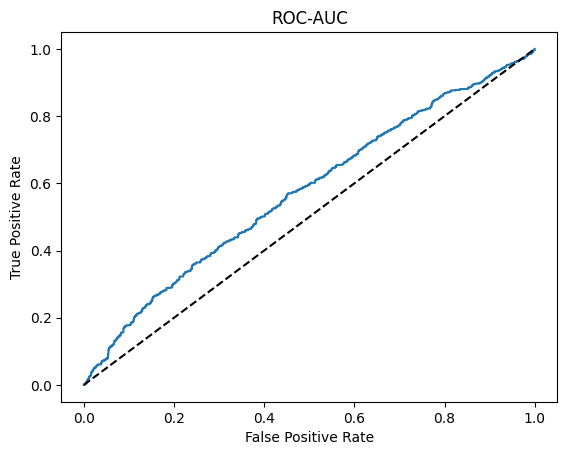

In [12]:
print("ROC AUC:", roc_auc)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

plt.plot(fpr, tpr, label='ROC-AUC = %0.2f' % roc_auc)

plt.title('ROC-AUC')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.plot([0, 1], [0, 1], 'k--');

<h3 style='color:red; font-size: 30px'>Вывод</h3>

Как вы оцениваете качество получившейся модели и возможные причины такого качества?

<p style='font-size: 18px'>
Модель выдала относительно плохие результаты. Такое может быть вызвано наличием достаточно маленьким количеством признаков, тем более сами признаки мало информативны по сравнению если бы мы учитывали покупки по разным категориям
</p>

# Часть 2: мб сделаем что-то более серьёзное? [макс 20 баллов]

Давайте попробуем улучшить качество решения задачи за счёт другого метода подготовки данных.

Ранее мы использовали простое преобразование, когда каждый клиент описывался только 3 значениями.
Давайте сделаем что-то более сложное и попробуем добавить больше данных о клиенте для модели.

## Подготовка данных [15 баллов]

Воспользуемся тем, что каждая транзакция у нас имеет свой тип - это уж точно более информативно, чем агрегация по всем транзакциям.

Создайте сводную таблицу, где для каждого клиента (строка) будут указаны его суммарные траты на каждую категорию (столбец). Таким образом, вы должны получить таблицу с числом строк равным количеству клиентов и числом столбцов - количеству категорий трат. Каждая ячейка должна содержать суммарные траты данного клиента в данной категории.

__Подсказка__: у DataFrame есть полезный метод `pivot_table`.

In [14]:
dff = df.groupby([df.index,'type']).agg({'value': 'sum'})
dff = pd.pivot_table(dff, index=dff.index.get_level_values(0), columns=['type'], fill_value=0)

dff

value  \
type     Авиалинии, авиакомпании   
user_id                            
22899                        0.0   
27914                        0.0   
28753                        0.0   
31385                        0.0   
38084                        0.0   
...                          ...   
99953525                     0.0   
99967537                     0.0   
99988578                     0.0   
99991245                     0.0   
99999680                     0.0   

                                                                     \
type     Авиалинии, авиакомпании, нигде более не классифицированные   
user_id                                                               
22899                                                   0.0           
27914                                                   0.0           
28753                                                   0.0           
31385                                                   0.0           
38084                                                   0.0           
...                                                     ...           
99953525                                                0.0           
99967537                                                0.0           
99988578                                                0.0           
99991245                                                0.0           
99999680                                                0.0           

                                                     \
type     Автобусные линии Автозапчасти и аксессуары   
user_id                                               
22899                 0.0                     0.000   
27914                 0.0                     0.000   
28753                 0.0                     0.000   
31385                 0.0                     0.000   
38084                 0.0                     0.000   
...                   ...                       ...   
99953525              0.0                     0.000   
99967537              0.0                     0.000   
99988578              0.0                     0.000   
99991245              0.0                  4446.915   
99999680              0.0                     0.000   

                                                              \
type     Автоматизированные бензозаправки Автомойки Автошины   
user_id                                                        
22899                                 0.0       0.0      0.0   
27914                                 0.0       0.0      0.0   
28753                                 0.0       0.0      0.0   
31385                                 0.0       0.0      0.0   
38084                                 0.0       0.0      0.0   
...                                   ...       ...      ...   
99953525                              0.0       0.0      0.0   
99967537                              0.0       0.0      0.0   
99988578                              0.0       0.0      0.0   
99991245                              0.0       0.0      0.0   
99999680                              0.0       0.0      0.0   

                                                                                                                                         \
type     Агентства по автотранспортным перевозкам, местные/дальные автогрузоперевозки, компании попереезду и хранению, местная доставка   
user_id                                                                                                                                   
22899                                                   0.0                                                                               
27914                                                   0.0                                                                               
28753                                                   0.0                                                                               
31385                    

In [15]:
# df_2 = dff.join(df['gender'])
df2 = pd.merge(dff, df_agr['gender'], left_index=True, right_index=True)


In [16]:
df2

,"(value, Авиалинии, авиакомпании)","(value, Авиалинии, авиакомпании, нигде более не классифицированные)","(value, Автобусные линии)","(value, Автозапчасти и аксессуары)","(value, Автоматизированные бензозаправки)","(value, Автомойки)","(value, Автошины)","(value, Агентства по автотранспортным перевозкам, местные/дальные автогрузоперевозки, компании попереезду и хранению, местная доставка)","(value, Агентства по аренде автомобилей)","(value, Агенты и менеджеры по аренде недвижимости)",...,"(value, Химикалии и смежные вещества, не классифицированные ранее)","(value, Химчистки)","(value, Ценные бумаги: брокеры/дилеры)","(value, Центры здоровья)","(value, Цифровые товары, игры)","(value, Школы — бизнес и секретарей)","(value, Штрафы)","(value, Штучные товары, галантерея и другие текстильные товары)","(value, Электрические части и оборудование)",gender
user_id,,,,,,,,,,,,,,,,,,,,,
22899,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0
27914,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0
28753,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0
31385,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0
38084,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99953525,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0
99967537,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,1.0
99988578,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,4267.24,0.0,0.0,0.0,0.0,1.0


## Обучение и валидация модели [5 баллов]

Аналогично предыдущей части разделите данные на обучающую и тестовую выборку (80%/20%), обучите модель на дефолтных параметрах и оцените качество.

In [17]:
feat = df2.drop('gender', axis=1).copy()
lab = df2.gender.copy()

X_tr, X_tst, Y_tr, Y_tst = train_test_split(feat, lab, test_size=0.2, random_state=42)

log_reg = LogisticRegression()

log_reg.fit(X_tr, Y_tr)


y_pred_prob = log_reg.predict_proba(X_tst)[:, 1]

y_pred = (y_pred_prob >= 0.5).astype(int)

roc_auc = roc_auc_score(Y_tst, y_pred_prob)

accuracy = accuracy_score(Y_tst, y_pred)

precision = precision_score(Y_tst, y_pred)

recall = recall_score(Y_tst, y_pred)

fpr, tpr, thresholds = roc_curve(Y_tst, y_pred_prob)


ROC AUC: 0.7893954956680187
Accuracy: 0.7165071770334929
Precision: 0.7
Recall: 0.6260162601626016


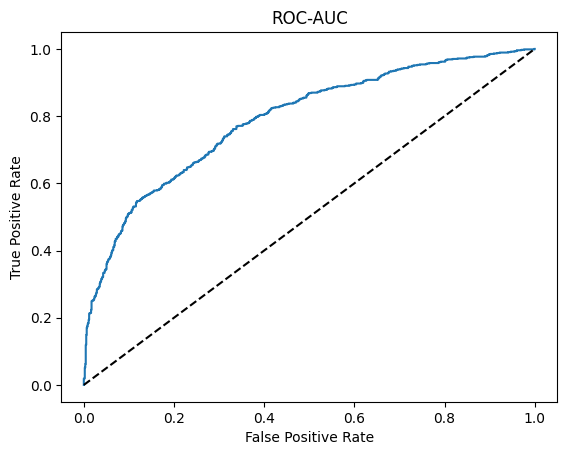

In [18]:
print("ROC AUC:", roc_auc)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)

plt.plot(fpr, tpr, label='ROC-AUC = %0.2f' % roc_auc)

plt.title('ROC-AUC')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.plot([0, 1], [0, 1], 'k--');

<h3 style='color:red; font-size: 30px'>Вывод</h3>

Изменилось ли качество модели? Почему?

<p style='font-size: 18px'> 
После того, как мы стали учитывать покупки по категориям, т.е. добавили большее количество признаков, модель стала показывать лучшие результаты по сравнению с предыдущим пунктом. К тому же признаки стали более информативными
</p>

# Часть 3: что мы всё про данные? Давайте про модель 
# [макс 30 баллов]

Ранее мы работали только над подготовкой обучающей выборки. Давайте теперь попробуем изменить модель, чтобы добиться наилучшего качества. 

Входные данные для этой части - выборка с предыдущей.

## Нормирование данных [5 баллов] 

Как мы знаем, линейные модели любят нормированные данные.

Приведите значения всех признаков в отрезок [0, 1]

__Замечание__: если вы используете метод, который удаляет информацию о названиях колонок - сохраните эти названия в отдельную переменную, вам это потом может понадобиться.

In [32]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

X_tr = scaler.fit_transform(X_tr)
X_tst = scaler.transform(X_tst)


## Подбор параметров [15 баллов]

Подберите наилучшие параметры для модели линейной регрессии. Важные уточнения:

* используйте перебор по сетке
* в качестве метрики используйте ROC AUC
* для оценки параметров делайте кросс-валидацию на 4 фолдах

__Замечание__: у линейной регрессии множество доступных значений для некоторых параметров зависит от метода оптимизации (solver). Например, lbfgs-алгоритм не подерживает l1-регуляризацию.

Поэтому действуйте шагами: сначала подберите solver, а потом уже переберите доступные для него параметры.

In [20]:
from sklearn.model_selection import GridSearchCV

params = {'C': np.arange(10,100, 10)}

logreg_ridge = LogisticRegression(penalty='l2', solver='lbfgs')

searcher = GridSearchCV(
    logreg_ridge, params, cv=4, verbose=10
)

searcher.fit(X_tr, Y_tr)
best_C = searcher.best_params_['C']


Fitting 4 folds for each of 9 candidates, totalling 36 fits
[CV 1/4; 1/9] START C=10........................................................
[CV 1/4; 1/9] END .........................C=10;, score=0.721 total time=   0.2s
[CV 2/4; 1/9] START C=10........................................................
[CV 2/4; 1/9] END .........................C=10;, score=0.701 total time=   0.2s
[CV 3/4; 1/9] START C=10........................................................
[CV 3/4; 1/9] END .........................C=10;, score=0.698 total time=   0.2s
[CV 4/4; 1/9] START C=10........................................................
[CV 4/4; 1/9] END .........................C=10;, score=0.727 total time=   0.2s
[CV 1/4; 2/9] START C=20........................................................
[CV 1/4; 2/9] END .........................C=20;, score=0.728 total time=   0.2s
[CV 2/4; 2/9] START C=20........................................................
[CV 2/4; 2/9] END .........................C=20;,

Оцените качество лучшей модели на тестовых данных аналогично предыдущим задачам.

In [161]:
logreg_ridge_best = LogisticRegression(penalty='l2', solver='lbfgs', C = best_C, random_state=42)

logreg_ridge_best.fit(X_tr, Y_tr)


y_pred_prob = logreg_ridge_best.predict_proba(X_tst)[:, 1]

y_pred = (y_pred_prob >= 0.5).astype(int)

roc_auc = roc_auc_score(Y_tst, y_pred_prob)

accuracy = accuracy_score(Y_tst, y_pred)

precision = precision_score(Y_tst, y_pred)

recall = recall_score(Y_tst, y_pred)

fpr, tpr, thresholds = roc_curve(Y_tst, y_pred_prob)

ROC AUC: 0.7922273869419637
Accuracy: 0.7242822966507177
Precision: 0.7678916827852998
Recall: 0.537940379403794


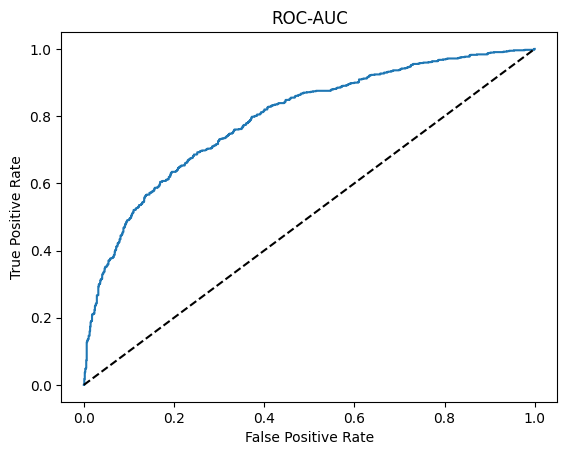

In [162]:
print("ROC AUC:", roc_auc)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
plt.plot(fpr, tpr)

plt.title('ROC-AUC')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.plot([0, 1], [0, 1], 'k--');

<h3 style='color:red; font-size: 30px'>Вывод</h3>

Получилось ли добиться лучше качества при подборе параметров?
Почему так? 

Для чего мы использовали одновременно кросс-валидацию и отложенную тестовую выборку?

<p style='font-size: 18px'> 
Как мы видим, результаты стали еще лучше, потому что в данном пункте была использована l2-регуляризация, которая позволяет избежать как переобучение, так и недообучение. Конкретно для этого задания был использован перебор только для C, потому что остальные параметры будут перебираться в дальнейших пунтках
<br>
<br>
Также нормализация данных внесла вклад в улучшение качества модели, потому что нормализация помогает избежать шума в данных и в предотвратить влияние какого-то признаки на результаты, которые выдает модель 
<br>
<br>
Одновременная кросс-валидация и отложенная тестовая выборка была использована чтобы более точно определить значение гиперпараметра C и в целом улучшить качество модели
</p>

## Подбор отсечения [5 баллов]

Ранее мы работали или с вероятностями из модели или с метками, полученных при отсечении по веростности с порогом 0.5.

Стоит сказать, что порог 0.5 для разделения классов не всегда самый лучший. Часто нам нужно так подобрать порог, чтобы удовлетворить наши требования по точности и полноте.

Давайте подберём порог, который максимизирует F_beta меру при условии, что нам полнота в 5 раз важнее точности.

Вычислите наилучший порог и нарисуйте график зависимости этой метрики от порога разделения.

In [23]:
from sklearn.metrics import f1_score, make_scorer, fbeta_score

thresholds = np.arange(0,1,0.05)

beta = np.sqrt(5)

y_f1 = logreg_ridge_best.predict_proba(X_tr)[:, 1]

best_threshold = 0
best_f1_score = 0
f1_s = []
for t in thresholds:
    y_pred = (y_f1 >= t).astype(int)

    f1 = fbeta_score(Y_tr, y_pred, beta=beta)
    f1_s.append(f1)
    if f1 > best_f1_score:
        best_f1_score = f1
        best_threshold = t

In [24]:
best_threshold

0.2

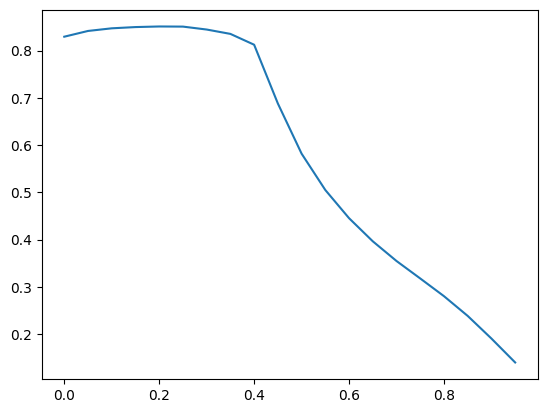

In [25]:
plt.plot(thresholds, f1_s);

In [26]:
y_pred = (y_pred_prob >= best_threshold).astype(int)

roc_auc = roc_auc_score(Y_tst, y_pred_prob)

accuracy = accuracy_score(Y_tst, y_pred)

precision = precision_score(Y_tst, y_pred)

recall = recall_score(Y_tst, y_pred)

fpr, tpr, thresholds = roc_curve(Y_tst, y_pred_prob)

ROC AUC: 0.7927351543322714
Accuracy: 0.5616028708133971
Precision: 0.5017743080198722
Recall: 0.9579945799457995


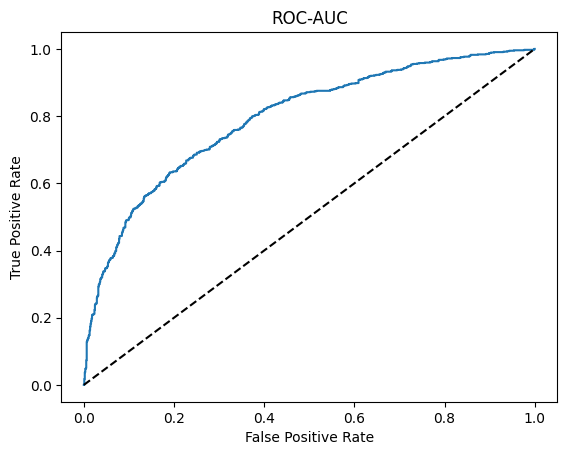

In [27]:
print("ROC AUC:", roc_auc)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
plt.plot(fpr, tpr)

plt.title('ROC-AUC')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.plot([0, 1], [0, 1], 'k--');

## Интерпретация модели [5 баллов]

Часто нам хочется интерпритировать предсказания модели - понять, как наши признаки влияют на её ответ.
В случае сложных моделей сделать это не просто - чем сложнее модель, тем более сложные закономерности она извлекает и тем тяжелее нам их понять.

Но в случае линейной регресии это просто сделать, посмотрев на её обучаемые параметры (вспоминайте!).

Получите список признаков, которые увеличивают вероятность метки 0.
Аналогично для метки 1.

In [64]:

cfs = logreg_ridge_best.coef_
features = dff['value'].columns
metrics = pd.DataFrame(index = features, columns=['Value'])
for feature, coef in zip(features, cfs[0]):
    metrics.xs(feature)['Value'] = coef
metrics

,Value
type,
"Авиалинии, авиакомпании",6.336915
"Авиалинии, авиакомпании, нигде более не классифицированные",-1.768674
Автобусные линии,0.013703
Автозапчасти и аксессуары,34.419517
Автоматизированные бензозаправки,2.737407
...,...
"Цифровые товары, игры",2.449586
Школы — бизнес и секретарей,8.774166
Штрафы,2.195991


In [164]:
print('Топ 10 признаков, увеличивающих вероятность метки мужского пола')
maximazing_1

Топ 10 признаков, увеличивающих вероятность метки мужского пола


,Value
type,
Автозапчасти и аксессуары,34.419517
"Телекоммуникационное оборудование, включая продажу телефонов",20.342823
Транзакции по азартным играм,17.20946
"Продажа музыкальных инструментов, фортепиано, нот",13.113523
Кинотеатры,11.220902
Автошины,11.19411
Станции техобслуживания,10.784398
Галереи/учреждения видеоигр,9.688986
Продажа молочных продуктов в розницу,9.566371


In [165]:
print('Топ 10 признаков, увеличивающих вероятность метки женского пола')
maximazing_0

Топ 10 признаков, увеличивающих вероятность метки женского пола


,Value
type,
Аптеки,-31.501135
"Ткани, обивочный материал, гардины и портьеры, жалюзи",-22.439519
"Звонки с использованием телефонов, считывающих магнитную ленту",-21.17926
Магазины косметики,-21.119323
Различные магазины одежды и аксессуаров,-19.046255
Готовая женская одежда,-14.750717
Аксессуары для женщин,-10.723102
Одежда для всей семьи,-10.425762
Магазины мужской и женской одежды,-9.054916


# Часть 4: ва-банк / пространство для творчества [макс 30 баллов]

Добейтесь максимального качества, больше качество - больше баллов.

Стратегия подготовки данных и обучения модели на ваше усмотрение.

Условия:
* Оценка на отложенной тестовой группе пользователей, использовавшейся в прошлых пунктах (20%)
* В качестве метрики используйте ROC_AUC

__Замечание__: 

Ответа на вопрос "какое нужно качество для максимального балла?" не будет.

Используйте все свои знания, чтобы добиться наилучшего результата.

In [81]:
import catboost

<img src="https://drive.google.com/uc?id=11rZ5L85APFvgwydIhZ6RX_Gfg4KwfvbT" width='1000'>

In [116]:
from catboost import CatBoostClassifier

params = {
    'iterations': [50, 100, 200],
    'depth': [3,5,6,7, 8,11],
    'learning_rate': [0.01, 0.1, 0.5],
    'loss_function': ['Logloss', 'CrossEntropy'],
    'l2_leaf_reg': [1,3,5,7,8],
    'verbose': [True]
}

model = CatBoostClassifier()

grid_search = GridSearchCV(model, param_grid=params, cv=4, scoring='roc_auc')

grid_search.fit(X_tr, Y_tr)


0:	learn: 0.6914175	total: 5.01ms	remaining: 245ms
1:	learn: 0.6896552	total: 8.76ms	remaining: 210ms
2:	learn: 0.6879201	total: 11.6ms	remaining: 182ms
3:	learn: 0.6859176	total: 14.8ms	remaining: 170ms
4:	learn: 0.6838996	total: 18.2ms	remaining: 164ms
5:	learn: 0.6822171	total: 21.1ms	remaining: 155ms
6:	learn: 0.6805084	total: 23.9ms	remaining: 147ms
7:	learn: 0.6789008	total: 26.6ms	remaining: 140ms
8:	learn: 0.6770775	total: 29.6ms	remaining: 135ms
9:	learn: 0.6752528	total: 32.9ms	remaining: 132ms
10:	learn: 0.6739279	total: 35.8ms	remaining: 127ms
11:	learn: 0.6724309	total: 38.5ms	remaining: 122ms
12:	learn: 0.6706833	total: 40.9ms	remaining: 116ms
13:	learn: 0.6692436	total: 44ms	remaining: 113ms
14:	learn: 0.6678999	total: 47ms	remaining: 110ms
15:	learn: 0.6663552	total: 49.8ms	remaining: 106ms
16:	learn: 0.6650451	total: 52.5ms	remaining: 102ms
17:	learn: 0.6635145	total: 55.2ms	remaining: 98.2ms
18:	learn: 0.6619257	total: 58.2ms	remaining: 95ms
19:	learn: 0.6604255	total

GridSearchCV(cv=4,
             estimator=<catboost.core.CatBoostClassifier object at 0x144caba90>,
             param_grid={'depth': [3, 5, 6, 7, 8, 11],
                         'iterations': [50, 100, 200],
                         'l2_leaf_reg': [1, 3, 5, 7, 8],
                         'learning_rate': [0.01, 0.1, 0.5],
                         'loss_function': ['Logloss', 'CrossEntropy'],
                         'verbose': [True]},
             scoring='roc_auc')

In [157]:
params_best = grid_search.best_params_
params_best['iterations'] = 700
params_best['depth'] = 6
params_best['learning_rate'] = 0.05

params_best

{'depth': 6,
 'iterations': 700,
 'l2_leaf_reg': 1,
 'learning_rate': 0.05,
 'loss_function': 'Logloss',
 'verbose': True}

In [158]:
model = CatBoostClassifier(**params_best)
model.fit(X_tr, Y_tr, eval_set=(X_tst, Y_tst))


0:	learn: 0.6808978	test: 0.6817157	best: 0.6817157 (0)	total: 23.9ms	remaining: 16.7s
1:	learn: 0.6694292	test: 0.6705980	best: 0.6705980 (1)	total: 35.5ms	remaining: 12.4s
2:	learn: 0.6578344	test: 0.6604775	best: 0.6604775 (2)	total: 45.7ms	remaining: 10.6s
3:	learn: 0.6468118	test: 0.6509784	best: 0.6509784 (3)	total: 56.8ms	remaining: 9.88s
4:	learn: 0.6387545	test: 0.6434368	best: 0.6434368 (4)	total: 66.6ms	remaining: 9.26s
5:	learn: 0.6316532	test: 0.6369046	best: 0.6369046 (5)	total: 75.7ms	remaining: 8.76s
6:	learn: 0.6245457	test: 0.6298801	best: 0.6298801 (6)	total: 84.7ms	remaining: 8.38s
7:	learn: 0.6169064	test: 0.6235279	best: 0.6235279 (7)	total: 98.1ms	remaining: 8.48s
8:	learn: 0.6100219	test: 0.6166774	best: 0.6166774 (8)	total: 233ms	remaining: 17.9s
9:	learn: 0.6042495	test: 0.6120047	best: 0.6120047 (9)	total: 343ms	remaining: 23.7s
10:	learn: 0.5977625	test: 0.6065124	best: 0.6065124 (10)	total: 401ms	remaining: 25.1s
11:	learn: 0.5931132	test: 0.6022913	best: 0

In [159]:
proba_predictions = model.predict_proba(X_tst)[:, 1]

y_pred = (proba_predictions >= best_threshold).astype(int)

roc_auc = roc_auc_score(Y_tst, proba_predictions)

accuracy = accuracy_score(Y_tst, y_pred)

precision = precision_score(Y_tst, y_pred)

recall = recall_score(Y_tst, y_pred)

fpr, tpr, thresholds = roc_curve(Y_tst, proba_predictions)

ROC AUC: 0.8447950940965513
Accuracy: 0.6561004784688995
Precision: 0.5660989456609895
Recall: 0.94579945799458


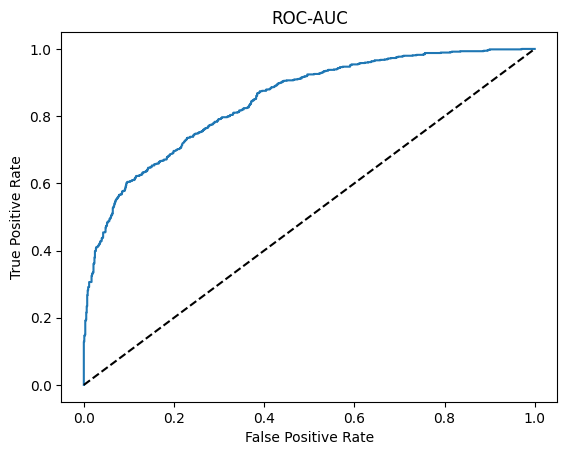

In [160]:
print("ROC AUC:", roc_auc)
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
plt.plot(fpr, tpr)

plt.title('ROC-AUC')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.plot([0, 1], [0, 1], 'k--');